# Discriminative segmentation of long speech recognition transcripts.

## Introduction and Motivation
Online learning has shown significant growth in the past decade[<sup>1</sup>](#fn1) . Moreover, the Covid-19 outbreak has forced schools, universities, and companies to leverage high quality online videos to create and spread knowledge resources. However, despite the abundance of online resources there exist several open challenges in video search, indexing, and segmentation that hinder users from specifically looking up segments of video lectures relevant to their query. In this project we aim to address the issue of topic segmentation in video lectures. Extraction of such semantically coherent clips from within a video improves the video search through better semantic indexing[<sup>2</sup>](#fn2). Through a discriminative model we aim to segment video transcripts into lexically cohesive topics using bidirectional representations. 

## Task Description, Challenges and Previous work


Unlike text documents, topic segmentation on transcriptions cannot readily exploit sentence boundaries and other graphical features in text. Additionally, topic segmentation of transcripts is also posed with the challenge of maintaining temporal coherence in topics. University and online video lectures can be seen as a monologue discourse and face similar challenges with transcription, segmentation and retrieval[<sup>3</sup>](#fn3). Lectures have the unique advantage of being (usually) well-structured: we might expect the breaks between topics and units, for example, to be fairly clear. Initial efforts to segment topics in monologue transcripts can be traced back to as early as 1997[<sup>4</sup>](#fn4) -98[<sup>5</sup>](#fn5) . Many of these initial systems were based on the idea of lexical cohesion[<sup>6</sup>](#fn6): the tendency of well-formed segments to induce a compact and consistent lexical distribution. Consequently, some these approaches such as the TopicTiling[<sup>7</sup>](#fn7) algorithm successfully explored marking boundaries in areas of low lexical cohesion, while others clustering based approaches such as the prominent C99[<sup>8</sup>](#fn8) uses neighbourhood of similarity measures to identify topics. Additionally, a brand of discriminatively trained models based on Hidden Markov Models(HMM)[<sup>9</sup>](#fn9), Conditional Random Fields (CRF)[<sup>10</sup>](#fn10), neural networks[<sup>11</sup>](#fn11) and Support Vector Machines[<sup>12</sup>](#fn12) have been used to tackle the problem. 

Most of these approaches relied on hand-crafted cohesion features and metrics to describe boundaries and predefined (pseudo) topics. Long documents are often modelled using sliding windows and text-tiling algorithms with the aim to capture long-term dependencies in monolog transcripts. However, It’s often difficult to build labelled datasets with predefined topic boundaries and hand crafted features. This project investigates a classification based discriminative approach using embeddings from transformer models and bidirectional representations to identify topic transitions in lecture transcripts. At the core of our methodology we rely on simulating topic transitions in transcripts by combining smaller lectures transcripts and identifying topic transitions as a classification task. This is by no means a novel approach, for instance, Reynar[<sup>13</sup>](#fn13) concatenates Wall Street Journal articles with the intention to simulate monologue discourse. However, the approach relies on parts of speech tags and close class words to detect boundaries. In contrast, our approach solely relies on the text input from the transcript to identity topic transitions.


## Related work

The closets work to the best of our knowledge is presented by TCS Innovation Labs[<sup>14</sup>](#fn14) where they use bi-directional representations from RNNs to perform topic segmentation of French newswire transcripts named EuroNews. However, due to the use of LSTMs, their methodologies still fails to model long sequences as they are often struck by the vanishing gradient problem[<sup>15</sup>](#fn15). We plan to overcome these challenges in our work through the use embeddings from the Transformer XL[<sup>16</sup>](#fn16) architecture that is specifically developed to tackle long sequences.
While all approaches have been show to benefit from inclusion of non-lexical features such as audio, prosody and video segmentation features this work focuses solely on the text transcripts. This is largely motivated by recent advancements in modelling long text sequences[<sup>17</sup>](#fn17) using attention mechanism[<sup>18</sup>](#fn18) and the availability of transcripts in most online learning platforms.


## Dataset

To perform the task of topic segmentation we collect approximately 10,000 video transcripts for lectures from the Khan Academy API[<sup>19</sup>](#fn19). We leverage the Khan Academy Topic Tree[<sup>20</sup>](#fn20) to find lectures transcripts organized under various topics, subjects and units. The topics are split on a hierarchy with varying degrees of granularity. 

The dataset can be downloaded by running the script [make_dataset.py](src/data/make_dataset.py). This first fetches the topic tree from [KhanAcademyAPI](http://api.khanacademy.org/api/v1/topictree) endpoint and fetches the `youtube_ids` for each lecture. We then retrieve the transcript for the lecture by hitting the [transcripts](http://api.khanacademy.org/api/internal/videos/{}/transcript) endpoint.

Here is a sample of the retrieved record from the raw dataset.
```json
{
  "title": "Greater than and less than symbols",
  "id": "x48102d13",
  "relative_url": "/video/greater-than-and-less-than-symbols",
  "youtube_id": "nFsQA2Zvy1o",
  "transcript": [
    {
      "text": "Most of us are familiar with\nthe equal sign from our earliest",
      "endTime": 4730,
      "startTime": 690,
      "kaIsValid": true
    },
    {
      "text": "days of arithmetic.",
      "endTime": 6330,
      "startTime": 4730,
      "kaIsValid": true
    },
    {
      "text": "You might see something\nlike 1 plus 1 is equal to 2.",
      "endTime": 10480,
      "startTime": 6330,
      "kaIsValid": true
    },
    ... [Truncated] ...
```

We then preprocess the transcripts and applying the following preprocessing steps.

1. remove timestamp information.
2. de-duplicate the dataset.
3. add topic information from the topic tree as an absolute path.

The applying these prepocessing steps to a sample record results in the following output.

```json
{
  "title": "Estimating when subtracting large numbers",
  "id": "x07db2c0bcf095f8d",
  "description_html": "Use estimation to find reasonable solutions to 2- and 3-digit subtraction problems.",
  "youtube_id": "de2aad2y03g",
  "transcript_text": "- [Narrator] Let's say that you have a jar of jelly beans, and you know that there are exactly 282 jelly beans in that jar of jelly beans. And then the next day you come and you see there are fewer and you say, what happened, and let's say someone who lives with you or your friend says, oh yeah, I counted exactly and I ate 59 estimating, we will use this squiggly equal sign. This means approximately, which is another, just a fancy way of saying roughly what is this equal to. ...[Truncated]",
  "topic_path": "root/math/in-in-class-3rd-math-cbse/x80b2f4aa70819288:imp-addition-and-subtraction/x80b2f4aa70819288:estimate-to-subtract-multi-digit-numbers/estimating-when-subtracting-large-numbers"
}
```
The preprocessed dataset can be downloaded from [here](https://drive.google.com/file/d/1BMhUDcyWEEJpMxcLC1yuS7ObMkfoG6I4/view?usp=sharing).

In [1]:
import pandas as pd

In [2]:
df = pd.read_json("data/ka_transcripts_categorized_deduplicated.json", lines=True, orient='records')
df = df.set_index("youtube_id")
df.head()

,title,id,description_html,transcript_text,topic_path
youtube_id,,,,,
de2aad2y03g,Estimating when subtracting large numbers,x07db2c0bcf095f8d,Use estimation to find reasonable solutions to...,- [Narrator] Let's say that you have a jar of ...,root/math/in-in-class-3rd-math-cbse/x80b2f4aa7...
He4cjB2ectc,Subtraction by breaking apart,x03251b0695245a43,Solve 2- and 3-digit subtraction problems by b...,- [Instructor] We're told that Linde isn't sur...,root/math/in-in-class-3rd-math-cbse/x80b2f4aa7...
ZIiZkmaehsU,Methods for subtracting 3-digit numbers,x46d56c8eb34a1fd5,Subtract 357-156 using place value strategies.,"- [Instructor] Hello. In this video, we're goi...",root/math/in-in-class-3rd-math-cbse/x80b2f4aa7...
9T3AAn-Cw3g,Worked example: Subtracting 3-digit numbers (r...,x708f7c61,Learn to use regrouping (borrowing) and place ...,Let's try to subtract 659 from 971. And as soo...,root/math/in-in-class-3rd-math-cbse/x80b2f4aa7...
QOtam19NQcQ,Subtracting 3-digit numbers (regrouping),x2ea1beb5,Sal uses regrouping (borrowing) and place valu...,I've written the same subtraction problem twic...,root/math/in-in-class-3rd-math-cbse/x80b2f4aa7...


### Exploratory Data Analysis

Through the exploratory data analysis phase of the dataset we wish to identify the following: 
1.	Number of total topics in the dataset. – This aids in developing better sampling strategies when creating the model training dataset.
2.	The distribution of transcripts across the various topic granularities.
3.	Identify the right length of training samples that approximately works on at least the median length of the transcripts.
4.	Explore and address the impact of the chosen metrics in four basic conditions of boundary detection i.e. hypothesizing no boundaries, boundaries everywhere, evenly-spaced boundaries or randomly-spaced boundaries. 


In [3]:
%matplotlib inline
import matplotlib.pylab as plt
import seaborn as sns
from IPython.display import display

In [4]:
def expand_topic_path(df):
    """Expand the topic tree path for each transcript record.
    
    params: df: The dataframe containing the transcripts and the topic path
    returns: df: The dataframe with the expanded topics as additional columns
    """
    lst = df['topic_path'].map(lambda x: x.split("/")).tolist()
    levels = ['root', 'domain', 'subject', 'topic_1', 'topic_2', 'topic_3']
    topics_df = pd.DataFrame(lst, index=df.index, columns=levels)

    df = pd.merge(df, topics_df, on='youtube_id')
    return df

In [5]:
# some basic description of the dataset
df = expand_topic_path(df)
df.describe()

,title,id,description_html,transcript_text,topic_path,root,domain,subject,topic_1,topic_2,topic_3
count,12529,12529,12522,12529,12529,12529,12529,12529,12529,12490,11792
unique,12276,12529,10919,10411,12529,1,12,163,1028,4065,11792
top,What I do and how much I make,1319534849,,,root/math/algebra2/x2ec2f6f830c9fb89:eq/x2ec2f...,root,math,health-and-medicine,circulatory-system-diseases,new-sat-writing-grammar,introduction-to-proteins-and-amino-acids
freq,53,1,839,2116,1,12529,4746,727,139,46,1


In [6]:
def show_topic_branching(df):
    topic_cols = ['root','domain','subject','topic_1','topic_2','topic_3']
    node_count = df.describe().loc['unique',topic_cols]
    counts_branching = [node_count, node_count.divide(node_count.shift(1))]
    index=["unique_nodes", "avg_branching_factor"]
    topic_hierarchy_df = pd.DataFrame(counts_branching, index)
    return topic_hierarchy_df
display(show_topic_branching(df))

,root,domain,subject,topic_1,topic_2,topic_3
unique_nodes,1.0,12.0,163.000000,1028.000000,4065.00000,11792.000000
avg_branching_factor,NaN,12.0,13.583333,6.306748,3.95428,2.900861


We can already see the topic tree is quite granular in nature and and organizes all the documents in with enough variation across the various transcripts. Let's look at the distribution across of transcripts across the top 2 levels of the tree.

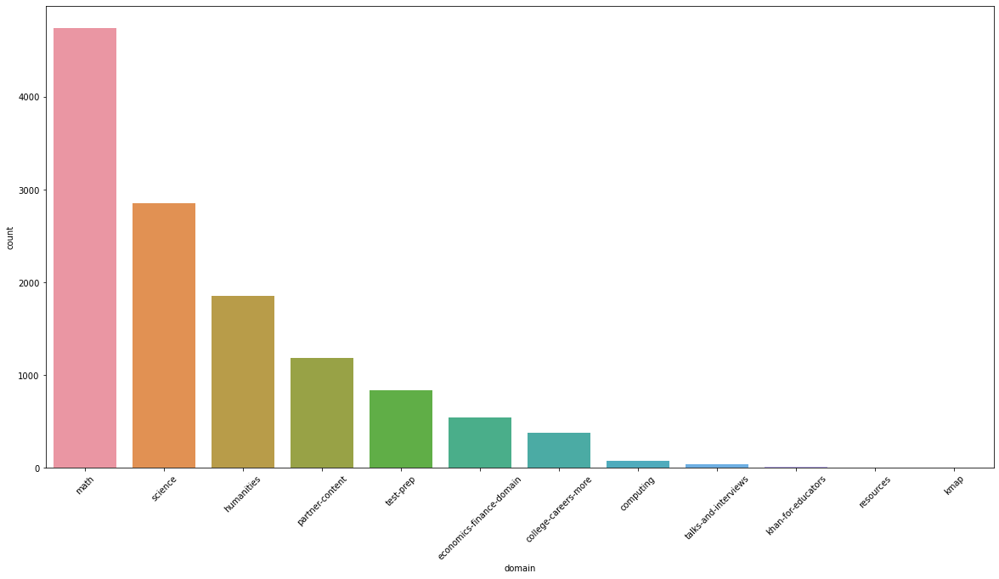

In [7]:
plt.figure(figsize=(20,10))
chart = sns.countplot(
    x='domain',
    data=df, order=df['domain'].value_counts().index)
chart.set_xticklabels(chart.get_xticklabels(), rotation=45)
plt.show()

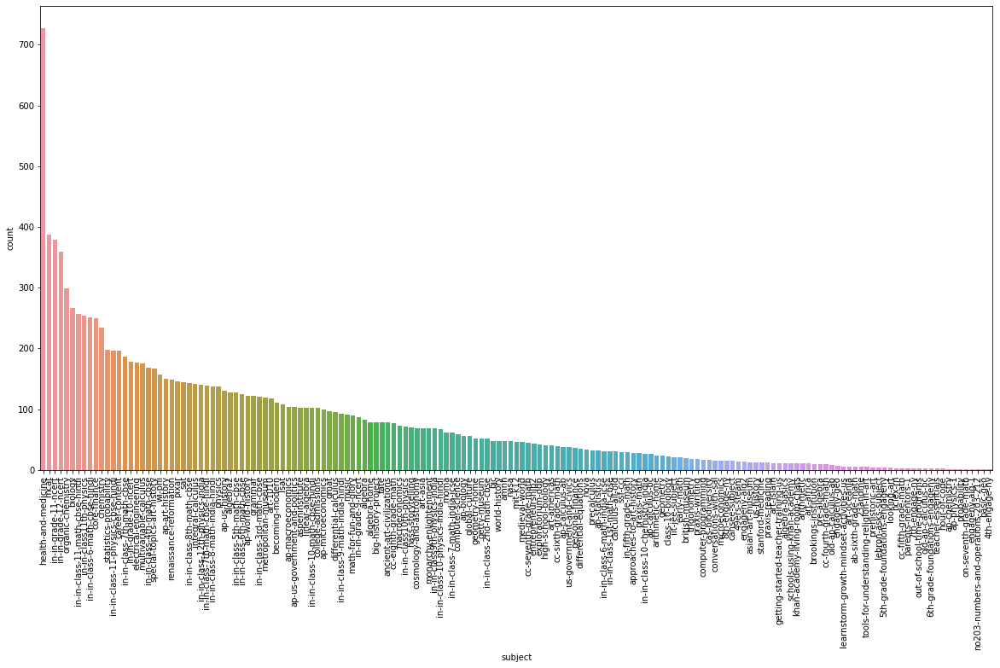

In [8]:
plt.figure(figsize=(20,10))
chart = sns.countplot(
    x='subject',
    data=df, order=df['subject'].value_counts().index)
chart.set_xticklabels(chart.get_xticklabels(), rotation=90)
plt.show()

The distribution is quite skewed with more videos in the Math and Science domains than any other domain. The motivates us to build a roubst model that is resilient to these skews in the data when identifying topic segments.

To identify distribution of terms across domains and additionally get an idea about the length of the transcripts we apply preprocess the data to simulate ASR output, this includes removing :
1. all sentence boundaries,
2. punctuations
3. numbers and other non-alphabetic characters.
4. removing common terms used as fillers in speech.

Additionally, for viewing term distributions across domains we remove stopwords and lemmatize the text and display a word-cloud for each of the 12 domains.

In [9]:
from gensim.parsing.preprocessing import preprocess_string, DEFAULT_FILTERS, STOPWORDS
import spacy
import wordcloud
from multiprocessing import Pool, cpu_count

nlp = spacy.load('en_core_web_sm')
nlp.disable_pipes(['parser', 'ner'])

stop_lemmas = [
    'voiceover', 'right', 'actually','let','thing', 'narrator', 'look', 
    'like', 'want', "-pron-", 'know', 'little', 'bit', 'kind', 'use', 'think'
]
def simple_preprocess(text, model=nlp, stops=stop_lemmas):
    text = " ".join(token.lemma_ for token in model(text) if token.lemma_.lower() not in stops)
    return " ".join(preprocess_string(text, filters=DEFAULT_FILTERS[:-1]))

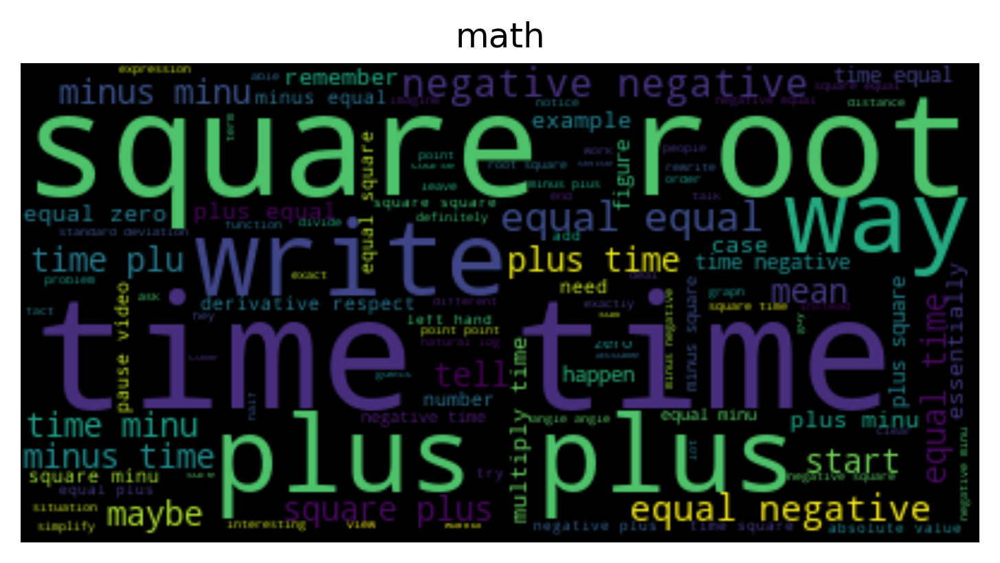

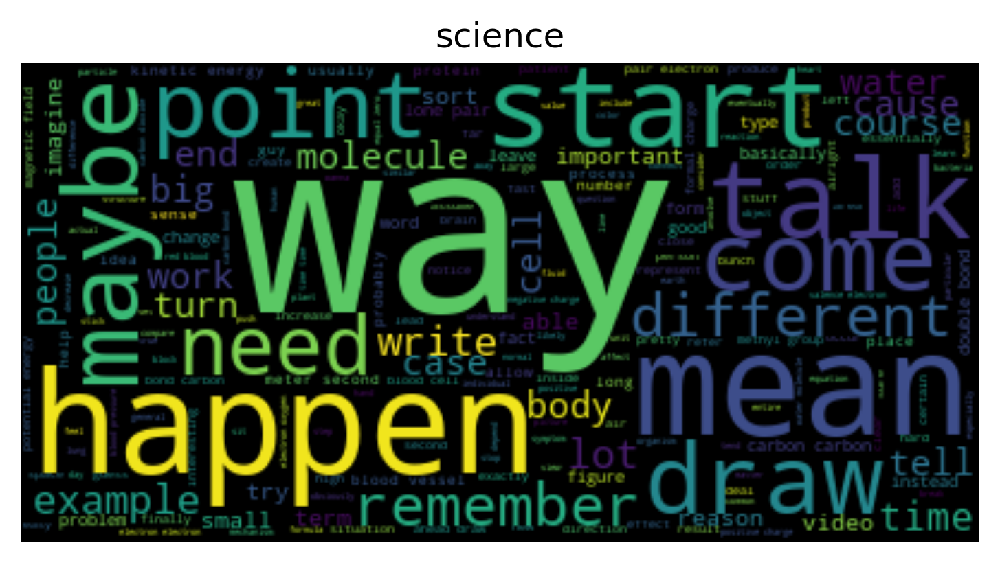

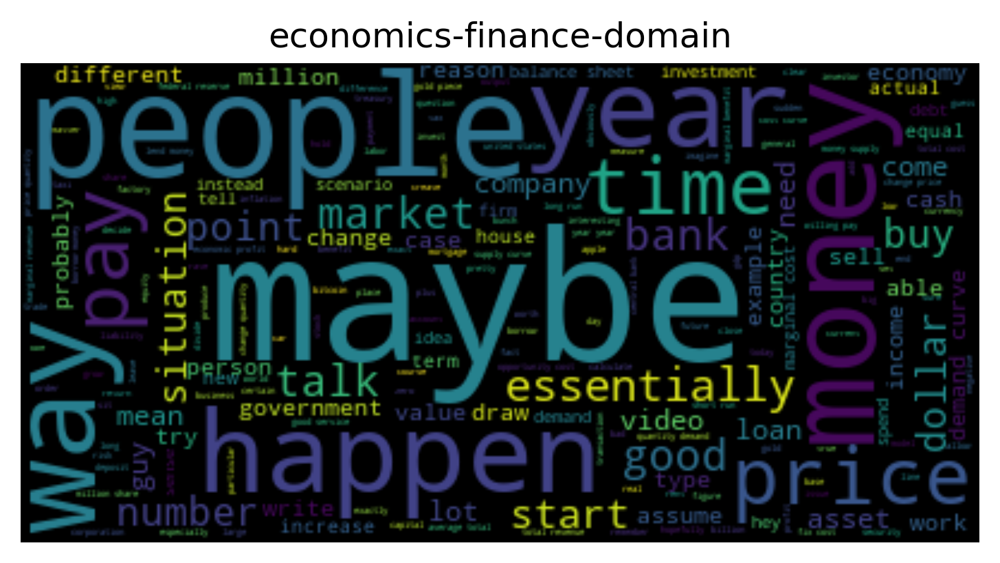

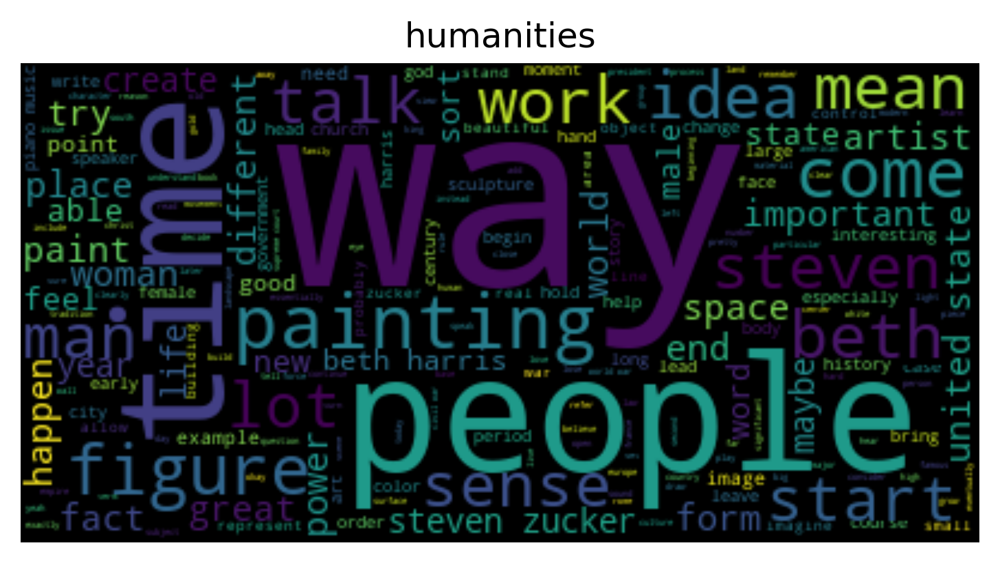

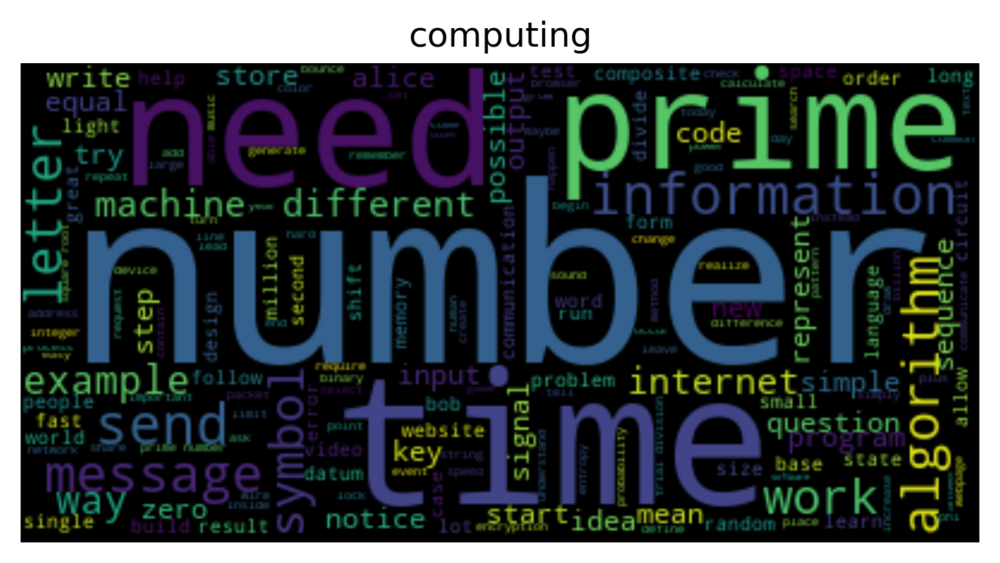

...

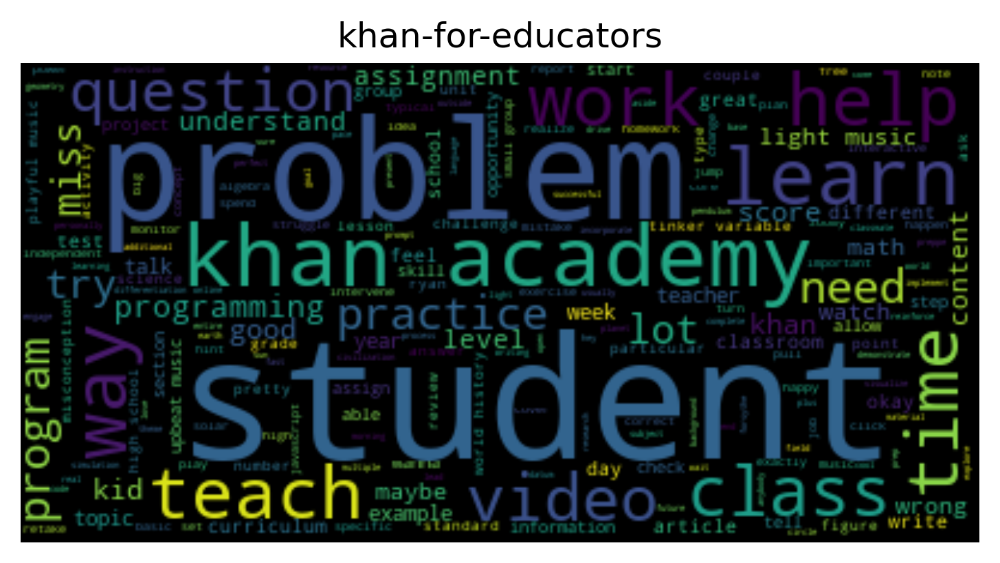

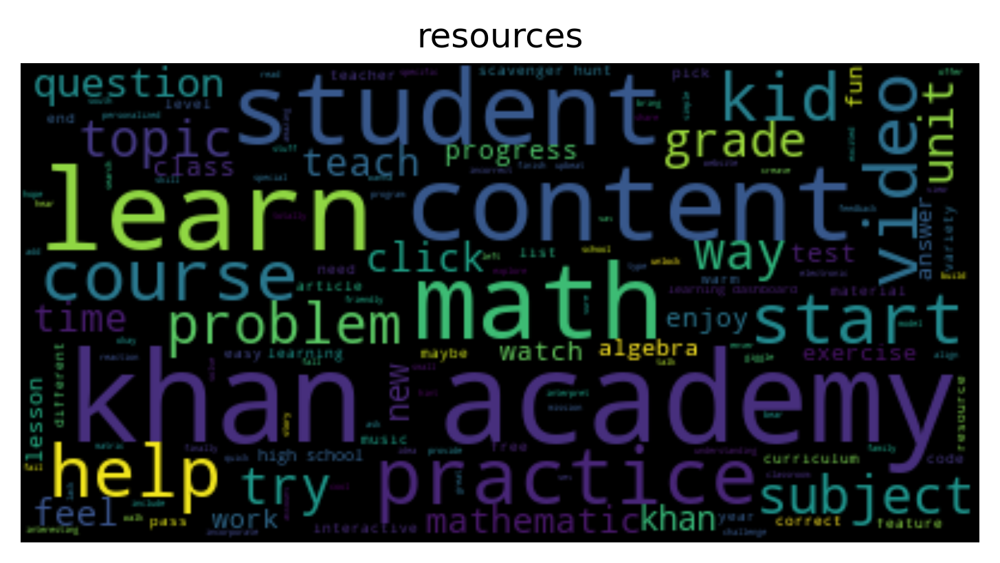

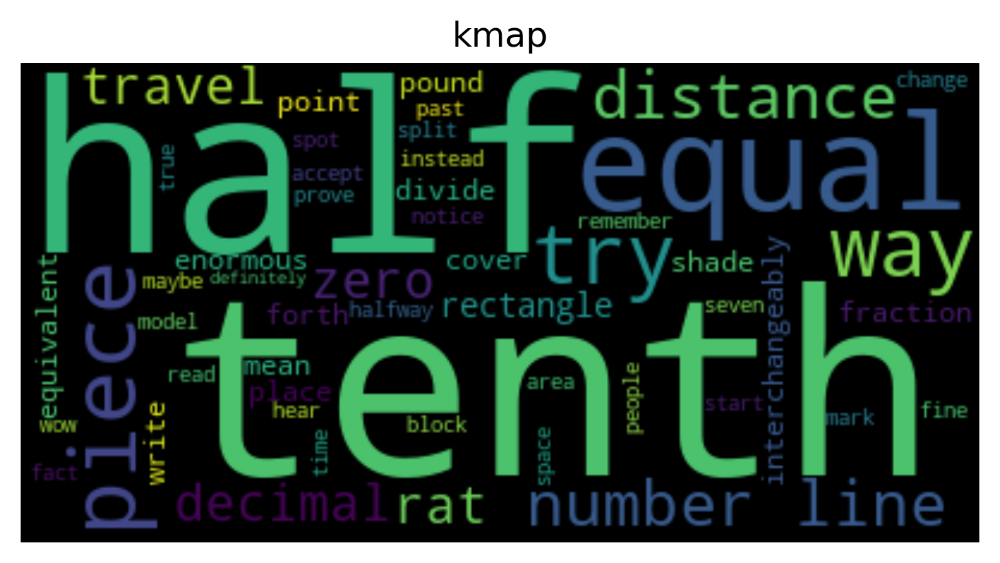

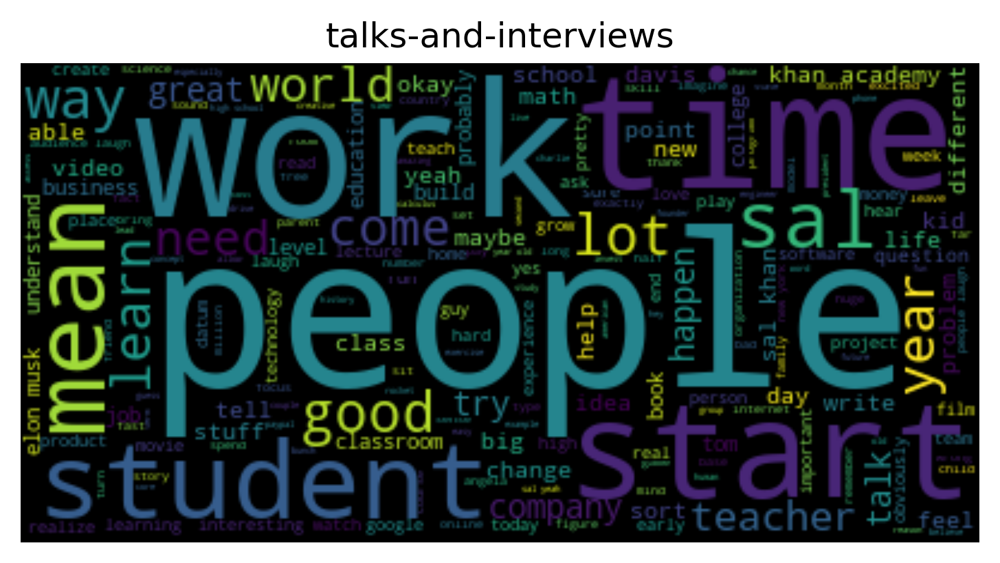

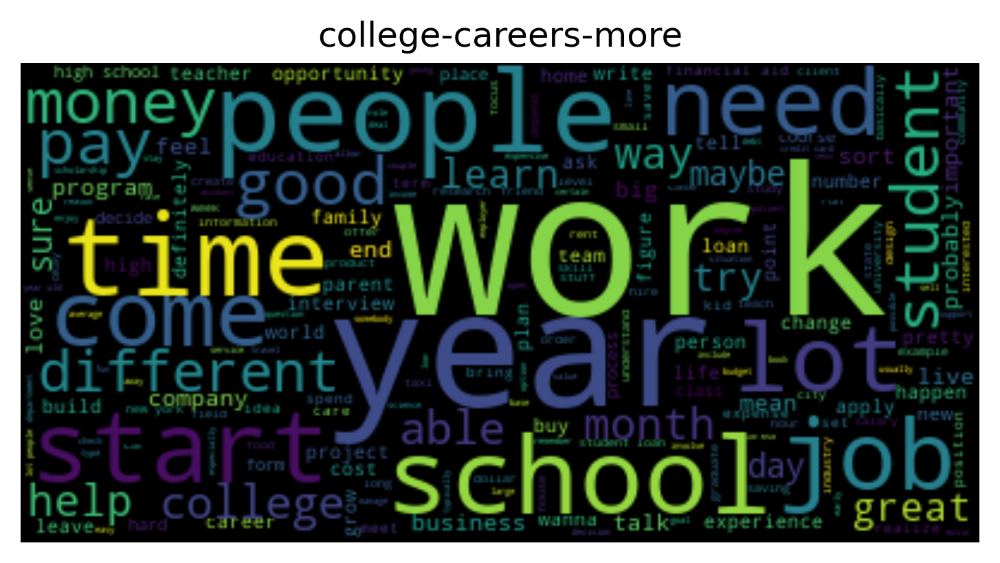

In [10]:
def show_topic_term_distributions(df):
    pool = Pool(cpu_count()-1)
    results = pool.map(simple_preprocess, df.transcript_text.tolist())
    df['preprocessed_transcript'] = [item for item in results]
    for group_name, group in df.groupby('domain', sort=False):
        title = group_name
        group_text = " ".join(text for text in group['preprocessed_transcript'])
        wcloud = wordcloud.WordCloud().generate(group_text)
        plt.figure(dpi=300)
        plt.imshow(wcloud, interpolation='bilinear')
        plt.title(title)
        plt.axis("off")
        plt.show()
show_topic_term_distributions(df)

1. top terms in larger topics such as math and science are mostly common across these topics.
2. top terms in some topics like computing, humanities are indicative of the domain.
3. while the vocabulary is shared across topics the have different semantics and meaning across various topics.

Next we look at the tokenized transcript lenghts. This informs us on the sequence lenght parameter to model.
Ideally we would like a model that works well with most of the dataset.

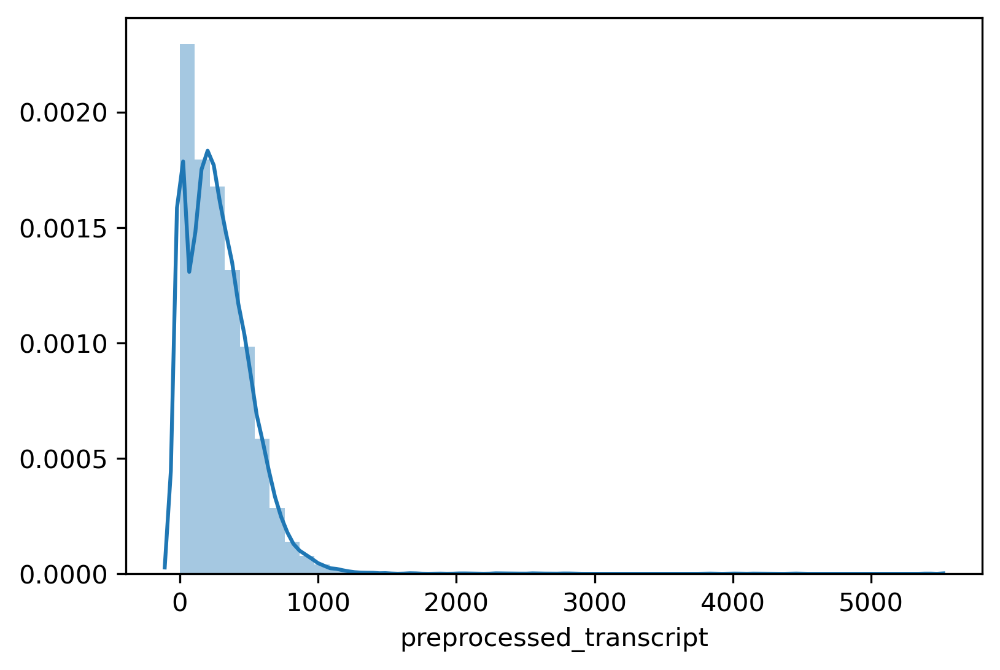

In [11]:
transcript_lengths = df.preprocessed_transcript.str.split().map(len)
plt.figure(dpi=300)
sns.distplot(transcript_lengths)
plt.show()

It seems like most of the transcripts are less than 1000 tokens in size. We set the `max_seq_len` of the models to be `1024` tokens. While truncating and padding from the end.

### Dataset Preparation

The exploratory stage informs us that the data is quite imbalanced and skewed across topics. To address this we sample the data evenly across the course and fine-grained topics in the topic tree. Then we preprocess the raw text, split the dataset into train, test, and validation splits in the ratio `70:15:15` and store it in text format. These files will be used in create datagenerators that sample and create training records at runtime. To create a single sample we randomly concatenate two or more transcripts from different topics and mark the topic boundaries.
The sampling strategy is described in the `sample_record` function in [utils.py](src/training/utils.py)

The below links contain the prepocessed data.
[train.txt](https://drive.google.com/file/d/1nNaoiuaZYMni-RAhjdciQC08wmazpMGY/view?usp=sharing)
[val.txt](https://drive.google.com/file/d/1s2Z42_FePMwlTIh4aVwTKYAexRrrOf8h/view?usp=sharing)
[test.txt](https://drive.google.com/file/d/1zVurLg-PD9hOYZqBTl4H6pWCzyJ90mhm/view?usp=sharing)


Here's an example of a sample transcript after preprocessing and simulating Automatic Speech Recognition(ASR) like morphology in the transcripts.

```plaintext
you ve probably heard of people having a stroke and you re probably familiar with the notion that it has something to do with the brain and you d be right in particular it s a rapid loss of brain function because of something strange happening with the blood flow to the brain and let me show you that in a little bit more detail and to do that let s think about the 2 major types of strokes there s the ischemic strokes and the other type of stroke is hemorrhagic and these can kind of be sub categorized but i won t go into all  ...[Truncated]
```

## Metrics and Evaluation

For comparison of the proposed and baseline methods, we use the standard topic segmentation evaluation measures $P_{k}$[<sup>22</sup>](#fn22). $P_{k}$ indicates the probability of segmentation error. It is the average probability, given two points in the transcript, that the hypothesized segment is incorrect as to whether they are separated by a boundary or not. A lower value indicating a better performance. We use the standard [implementation](https://www.nltk.org/api/nltk.metrics.html#nltk.metrics.segmentation.pk) in nltk library to calculate this metric. 
A window size(k) of 20 words on each side of a true segmentation point will be used to label a hypothesised segmentation point as true positive or false positive.

We also calculate the Precision ($P$) and Recall ($R$) on the segmentation results, and report the $F_{1}$ score which was calculated as $F_{1}$ $ = 2(P * R)/(P +R)$. We use the [macro-fscore](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.f1_score.html) measure from scikit-learn library. Since we are more interested in the identification of the segment boundaries.



## Models
Most current methodology uses a tiling window approach to segment transcripts. However, with the recent advances in NLP and the ability to model long sequences we are motivated to use a model that uses a single pass over the sequence to identify the topic transitions. 

Particularly, we wish to model the similarity of a token at timestep $t$ to **itself** in the forward and backward direction. Concretely, the forward representation of a token at timestep $t_{f}$ corresponds to the hidden activation of the forward LSTM and the backward representation at timestep $t_{b}$ corresponds to the hidden activation of the backward LSTM. We use the dot product of these representations to capture the similarity between the forward that backward representations. We hypothesize that lower similarity values should indicate topic transitions in the sequence. 


This nolinear similarity can be modelled with the binarycrossentropy loss. We use the sigmoid activation function in the final layer to indicate the transition in topics. First we establish baselines using word2vec and LSTMs configurations and test the impact of the choice of activations such as inverted sigmoid for the final layer. We then carry this forward with transformer models and report the results of our experiments.

## Baseline

Due to the novelty of the dataset we have no previous baselines on the dataset. Therefore, we report the baseline performance of the bi-directional LSTM models on input representations using glove 300d[<sup>21</sup>](#fn21) vectors as a baseline. We tokenize the text by splitting on space and retaining all words found in glove vectors while assigning `unk` token to tokens out of the glove vocabulary.

We test the performance of the various configurations of the transformer models against these baseline models trained on word2vec representations.

Due to the size of the input sequences(1024 tokens) we restrict the training and validation bacth sizes to 6 records to prevent memory issues.


### Baseline Architectures
Since we wanted to establish a strong baseline we define 8 baseline configurations.

1. Pretrained Glove300d + bi-LSTM(512) + inverted sigmoid
2. Finetuned Glove300d + bi-LSTM(512) + inverted sigmoid
3. Pretrained Glove300d  + 2x(bi-LSTM(512)) + bi-LSTM + inverted sigmoid
4. Finetuned Glove300d  + 2x(bi-LSTM(512)) + bi-LSTM + inverted sigmoid
5. Pretrained Glove300d + bi-LSTM(512) + sigmoid
6. Finetuned Glove300d + bi-LSTM(512) + sigmoid
7. Pretrained Glove300d  + 2x(bi-LSTM(512)) + bi-LSTM + sigmoid
4. Finetuned Glove300d  + 2x(bi-LSTM(512)) + bi-LSTM + sigmoid

We additionally add layer normalization and dropout(0.5) to reduce overfitting on the training data.

We train each model with adam optimizer with a learning rate schedule that reduces the learning rate on plateau. Additionally, use early stopping and monitor the validation loss to prevent the models from overfitting.

For further details about the baseline architecture and training, refer to [baseline_model.py](src/models/baseline_model.py) and [train_baseline.py](src/training/train_baseline.py).

The models and their training logs can be downloaded from [here](https://drive.google.com/drive/folders/1-mchg6QDJepoi8jkCnHR00bB3S47HA66?usp=sharing)

### Baseline performance

The following table records the performance of the baseline models.

<table border="1" class="dataframe"> <thead> <tr style="text-align: right;"> <th></th> <th>model_architecture</th> <th>pk_score</th> <th>precision</th> <th>recall</th> <th>f1_score</th> </tr> </thead> <tbody> <tr> <th>0</th> <td>baseline_em-300-0_LS-0-512_HD-512</td> <td>0.331833</td> <td>0.995736</td> <td>0.533555</td> <td>0.562034</td> </tr> <tr> <th>1</th> <td>baseline_em-300-1_LS-0-512_HD-512</td> <td>0.332143</td> <td>0.934262</td> <td>0.547154</td> <td>0.584331</td> </tr> <tr> <th>2</th> <td>baseline_em-300-0_LS-2-512_HD-512</td> <td>0.334301</td> <td>0.998678</td> <td>0.634995</td> <td>0.711930</td> </tr> <tr> <th>3</th> <td>baseline_em-300-1_LS-2-512_HD-512</td> <td>0.330404</td> <td>0.998731</td> <td>0.639062</td> <td>0.716968</td> </tr> <tr> <th>4</th> <td>baseline_em-300-0_LS-0-512_HD-512-rev</td> <td>0.332517</td> <td>0.498214</td> <td>0.500000</td> <td>0.499105</td> </tr> <tr> <th>5</th> <td>baseline_em-300-1_LS-0-512_HD-512-rev</td> <td>0.335556</td> <td>0.498220</td> <td>0.500000</td> <td>0.499108</td> </tr> <tr> <th>6</th> <td>baseline_em-300-0_LS-2-512_HD-512-rev</td> <td>0.336450</td> <td>0.498200</td> <td>0.500000</td> <td>0.499098</td> </tr> <tr> <th>7</th> <td>baseline_em-300-1_LS-2-512_HD-512-rev</td> <td>0.336282</td> <td>0.498205</td> <td>0.500000</td> <td>0.499101</td> </tr> </tbody> </table>

The perfomance of the baseline models leads to the following observations.
1. The inverted sigmoid function is the right choice of the activation for the models. Notice that fscore of the models with sigmoid activation is as close to random segmentation.
2. Adding additional sequence modelling information using bi-directional LSTMs improves the performance of the model.
3. Training the embedding layer only marginally improves the performance of the models.
4. The probability of segmentation error for all models (>.30) is high when compared to previous work which is at about .25

We additionally look at the model loss to understand model covergence and inductive bias of the model architectures.

,epoch,loss,accuracy,precision,recall,val_loss,val_accuracy,val_precision,val_recall,lr,model_name
0,0,0.776819,0.003569,0.000000,0.000000,0.693146,0.003870,0.000000,0.000000,3.000000e-04,baseline_em-300-0_LS-0-512_HD-512
1,1,0.693114,0.003591,0.000000,0.000000,0.693020,0.003564,0.000000,0.000000,3.000000e-04,baseline_em-300-0_LS-0-512_HD-512
2,2,0.693097,0.003560,0.000000,0.000000,0.693019,0.003516,0.000000,0.000000,3.000000e-04,baseline_em-300-0_LS-0-512_HD-512
3,3,0.693114,0.003548,0.000000,0.000000,0.692993,0.003540,0.000000,0.000000,3.000000e-04,baseline_em-300-0_LS-0-512_HD-512
4,4,0.693118,0.003574,0.000000,0.000000,0.692989,0.003406,0.000000,0.000000,3.000000e-05,baseline_em-300-0_LS-0-512_HD-512
5,5,0.693113,0.003557,0.000000,0.000000,0.693026,0.003406,0.000000,0.000000,3.000000e-05,baseline_em-300-0_LS-0-512_HD-512
6,6,0.693120,0.003550,0.000000,0.000000,0.693057,0.003284,0.000000,0.000000,3.000000e-06,baseline_em-300-0_LS-0-512_HD-512
7,7,0.693119,0.003579,0.000000,0.000000,0.693015,0.003699,0.000000,0.000000,3.000000e-06,baseline_em-300-0_LS-0-512_HD-512
8,8,0.693120,0.003574,0.000000,0.000000,0.693007,0.003723,0.000000,0.000000,3.000000e-07,baseline_em-300-0_LS-0-512_HD-512
9,9,0.693119,0.003574,0.000000,0.000000,0.693016,0.003577,0.000000,0.000000,3.000000e-07,baseline_em-300-0_LS-0-512_HD-512


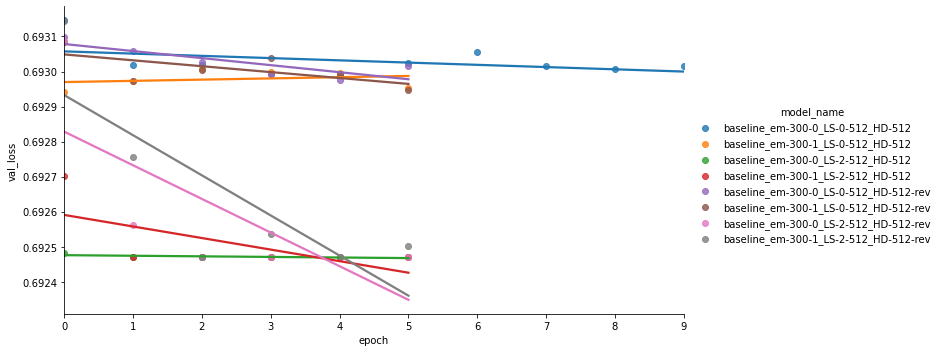

In [12]:
baseline_model_names = [
    'baseline_em-300-0_LS-0-512_HD-512',
    'baseline_em-300-1_LS-0-512_HD-512',
    'baseline_em-300-0_LS-2-512_HD-512',
    'baseline_em-300-1_LS-2-512_HD-512',
    'baseline_em-300-0_LS-0-512_HD-512-rev',
    'baseline_em-300-1_LS-0-512_HD-512-rev',
    'baseline_em-300-0_LS-2-512_HD-512-rev',
    'baseline_em-300-1_LS-2-512_HD-512-rev'
]

def show_baseline_loss(model_names):
    dfs = []
    for model_name in model_names:
        fname = f"models/baseline_models/{model_name}/logs/history.json"
        df = pd.read_json(fname)
        df = df.reset_index()
        df = df.rename({"index": "epoch"}, axis=1)
        df['model_name'] = model_name
        dfs.append(df)
    metrics_dfs = pd.concat(dfs, axis=0, ignore_index=True)
    display(metrics_dfs)
    l = sns.FacetGrid(metrics_dfs, hue='model_name', height=5, aspect=2)
    l.map(sns.regplot, "epoch", "val_loss",ci=None)
    l.add_legend()
    plt.show()
show_baseline_loss(baseline_model_names)

Note that the baseline models converge quickly and early stopping kicks at about 5 epochs(30000 samples). While the models with the sigmoid activation converge to a lower loss their perfomance on the segmemtation is not good enough. This perhaps indicates that the models is unable to perform the task of segmenation with the activation function.

## Transformer Models

For the transformer models we use the [transformer-xl](https://huggingface.co/transfo-xl-wt103) model from the transformer library by huggingface. We get the last hidden states of each token in the input sequence and feed it into a bi-LSTM models with inverted sigmoid activations. Due to large size of the transformer-xl model (29M parameters) we do not finetune the base model. However, we do train the bi-LSTM and the additional reprojection layer to model the forward and backward representations.

We define the following architectures for the transformer model:

1. transformer_xl + LSTM(512) + hidden_dimension(128) + inverted sigmoid
2. transformer_xl + LSTM(128) + hidden_dimension(512) + inverted sigmoid

We include layer normalization and dropout(0.5) to reduce overfitting on the training dataset.

We follow the same training procedure as the baseline models and record the performance on the test set.

For further details about the baseline architecture and training, refer to [transformer_model.py](src/models/transformer_model.py) and [train_transformers.py](src/training/train_transformers.py).

The models and their training logs can be downloaded from [here](https://drive.google.com/drive/folders/1-mchg6QDJepoi8jkCnHR00bB3S47HA66?usp=sharing)

### Transformer Performance

The following table records the performance of the baseline models.



In [13]:
transformer_model_names = [
    "transformer_xl-0_LS-512_HD-128",
    "transformer_xl-0_LS-128_HD-512",
    "transformer_xl-0_LS-512_HD-512"]
all_metrics = []
for model_name in transformer_model_names:
    fname = f"models/transformer_xl/{model_name}/logs/eval_results.json"
    metrics = json.load(open(fname))
    metrics['model_name'] = model_name
    all_metrics.append(metrics)
    
pd.DataFrame(all_metrics)

,pk_score,precision,recall,f1_score,model_name
0,0.002540,0.998402,0.636819,0.714182,transformer_xl-0_LS-512_HD-128
1,0.003532,0.998234,0.500177,0.499470,transformer_xl-0_LS-128_HD-512
2,0.002543,0.998727,0.638266,0.715990,transformer_xl-0_LS-512_HD-512


,epoch,loss,accuracy,precision,recall,val_loss,val_accuracy,val_precision,val_recall,lr,model_name
0,0,0.042754,0.994779,0.996598,0.998167,0.024072,0.996623,0.996623,1.000000,0.00030,transformer_xl-0_LS-512_HD-128
1,1,0.028364,0.996038,0.996612,0.999422,0.017246,0.996574,0.996573,1.000000,0.00030,transformer_xl-0_LS-512_HD-128
2,2,0.024994,0.996335,0.996757,0.999574,0.016604,0.996769,0.996769,1.000000,0.00030,transformer_xl-0_LS-512_HD-128
3,3,0.023370,0.996452,0.996837,0.999611,0.020391,0.996615,0.996614,1.000000,0.00030,transformer_xl-0_LS-512_HD-128
4,4,0.022919,0.996517,0.996889,0.999624,0.013343,0.997241,0.997264,0.999976,0.00030,transformer_xl-0_LS-512_HD-128
5,5,0.021305,0.996624,0.997009,0.999611,0.022084,0.997078,0.997085,0.999992,0.00030,transformer_xl-0_LS-512_HD-128
6,6,0.020794,0.996834,0.997117,0.999714,0.016121,0.997021,0.997020,1.000000,0.00030,transformer_xl-0_LS-512_HD-128
7,7,0.020341,0.996865,0.997183,0.999678,0.015490,0.997396,0.997394,1.000000,0.00030,transformer_xl-0_LS-512_HD-128
8,8,0.019655,0.996945,0.997203,0.999739,0.020317,0.997388,0.997385,1.000000,0.00030,transformer_xl-0_LS-512_HD-128
9,9,0.019185,0.997127,0.997346,0.999778,0.014259,0.997371,0.997369,1.000000,0.00030,transformer_xl-0_LS-512_HD-128


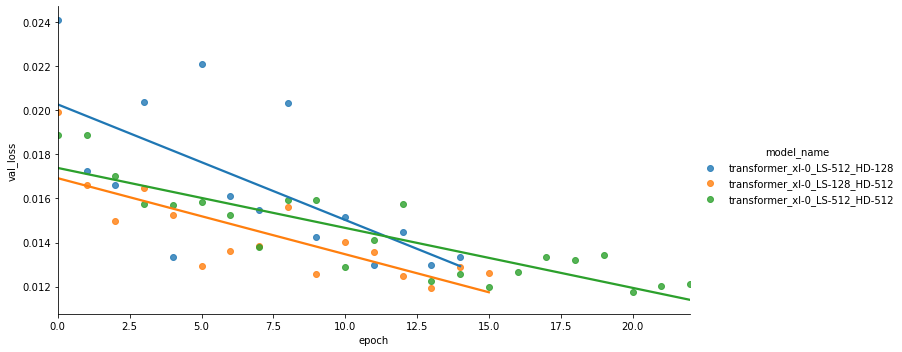

In [14]:
def show_transformer_loss(model_names):
    dfs = []
    for model_name in model_names:
        fname = f"models/transformer_xl/{model_name}/logs/metrics.json"
        data = map(json.loads,open(fname).readlines())
        data = map(lambda x: x['logs'], data)
        data = list(data)
        df = pd.DataFrame(data)
        df = df.reset_index()
        df = df.rename({"index": "epoch"}, axis=1)
        df['model_name'] = model_name
        dfs.append(df)
    metrics_dfs = pd.concat(dfs, axis=0, ignore_index=True)
    display(metrics_dfs)
    l = sns.FacetGrid(metrics_dfs, hue='model_name', height=5, aspect=2)
    l.map(sns.regplot, "epoch", "val_loss",ci=None)
    l.add_legend()
    plt.show()
show_transformer_loss(transformer_model_names)

These models are quite powerful in learning to segment the transcript. However, we should not explictly rely on the  fscore measure above since we are more interested in the segmentation itself. The probability of segmentation error $P_{k}$ is quite low when compared to the baseline models. However, we need to consider the effect of the confidence threshold value we choose at inference time. The current evaluations are done with a threshold of `0.5` which might not necessarily be the true decision boundary.

## Model Inference

To run inference on the model we first sample records from the test set and visualize the true and hypothesized segmentation.

In [15]:
%load_ext autoreload
%autoreload 2

load the inference pipeline

In [16]:
import numpy as np
from src.pipeline import inference_pipeline
inference_config = inference_pipeline.Config()
inference_config.THRESHOLD = 0.9
inference_pipe = inference_pipeline.InferencePipeline(inference_config)

Some weights of the model checkpoint at transfo-xl-wt103 were not used when initializing TFTransfoXLModel: ['crit']
- This IS expected if you are initializing TFTransfoXLModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPretraining model).
- This IS NOT expected if you are initializing TFTransfoXLModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFTransfoXLModel were initialized from the model checkpoint at transfo-xl-wt103.
If your task is similar to the task the model of the ckeckpoint was trained on, you can already use TFTransfoXLModel for predictions without further training.


Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 1024)]       0                                            
__________________________________________________________________________________________________
tf_transfo_xl_model (TFTransfoX [(None, 1024, 1024), 283885936   input_1[0][0]                    
__________________________________________________________________________________________________
dropout_73 (Dropout)            multiple             0           tf_transfo_xl_model[0][0]        
                                                                 dense[0][0]                      
                                                                 dense[1][0]                      
______________________________________________________________________________________________

In [17]:
# load the preprocessed test samples and run inference
batches_x, batches_y = np.load("data/test_samples.npz")
with np.load('data/test_samples.npz') as data:
    batches_x = data['batches_x']
    batches_y = data['batches_y']
    
# run inference    
preds = inference_pipe.model.predict(batches_x, batch_size=6, verbose=1)
res = [(preds[idx], batches_y[idx]) for idx in np.random.choice(np.arange(len(batches_y)),9)]

10/10 [==============================] - 94s 9s/step


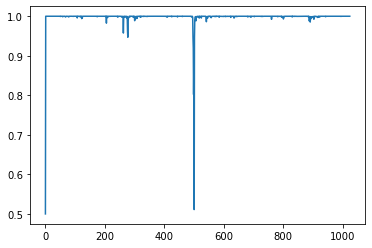

In [18]:
plt.plot(np.arange(1024), preds[0])

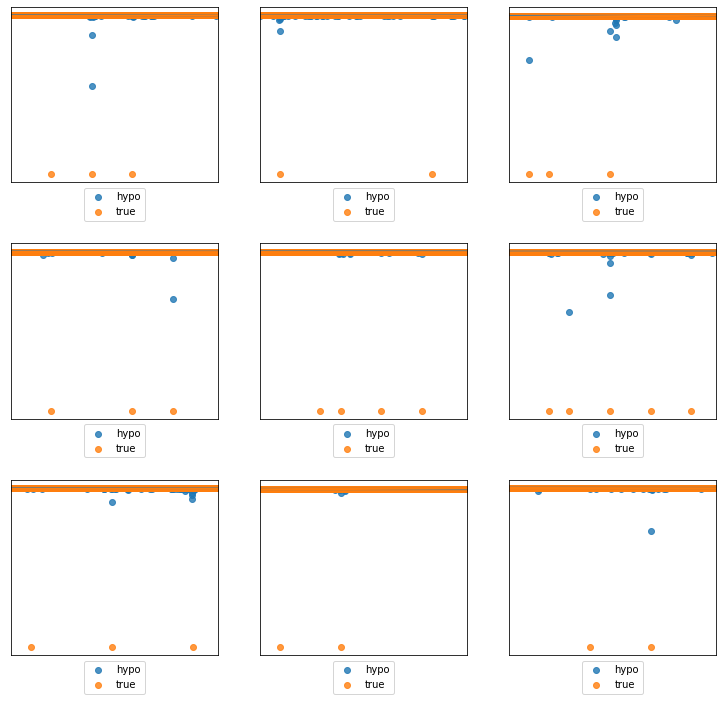

In [19]:
def plot_gallery(records, n_row=3, n_col=3):
    """Helper function to plot a gallery of results"""
    plt.figure(figsize=(10,10))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
    for i in range(n_row * n_col):
        plt.subplot(n_row, n_col, i + 1)
        ax = sns.regplot(np.arange(1023), records[i][0][1:], label="hypo")
        ax = sns.regplot(np.arange(1023), records[i][1][1:], label="true")
        ax.legend(loc='lower center',bbox_to_anchor=(0.5, -0.25))
        plt.xticks(())
        plt.yticks(())
plot_gallery(res, n_row=3, n_col=3)

The above plot indicates the transitions predicted by the model against the true transitions in the test set. We can see that the model's prediction transitions are close to the true transitions in the dataset. However, the model confidence scores are quite low. This is perhaps indicates that the model is indeed learning but needs more data and longer training scheludes to increase the confidence in it's predictions. Lets explore the model transitions on an unseen sample of text.

In [20]:
from IPython.display import display, Markdown, Latex

In [21]:
# sample_text = open("data/microsoft_transcript.txt").read()
sample_text = open("data/wikiarticle.txt").read()
md_text = f"""
```plaintext 
{sample_text}
```"""
display(Markdown(md_text))



```plaintext 
The Euclidean division is the mathematical formulation of the outcome of the usual process of division of integers. It asserts that, given two integers, a, the dividend, and b, the divisor, such that b ≠ 0, there are unique integers q, the quotient, and r, the remainder, such that a = bq + r and 0 ≤ r < |b|, where |b| denotes the absolute value of b.

Of integers
Integers are not closed under division. Apart from division by zero being undefined, the quotient is not an integer unless the dividend is an integer multiple of the divisor. For example, 26 cannot be divided by 11 to give an integer. Such a case uses one of five approaches:

Say that 26 cannot be divided by 11; division becomes a partial function.
Give an approximate answer as a "real" number. This is the approach usually taken in numerical computation.
Give the answer as a fraction representing a rational number, so the result of the division of 26 by 11 is {\displaystyle {\tfrac {26}{11}}}{\tfrac {26}{11}} (or as a mixed number, so {\displaystyle {\tfrac {26}{11}}=2{\tfrac {4}{11}}.}{\displaystyle {\tfrac {26}{11}}=2{\tfrac {4}{11}}.}) Usually the resulting fraction should be simplified: the result of the division of 52 by 22 is also {\displaystyle {\tfrac {26}{11}}}{\tfrac {26}{11}}. This simplification may be done by factoring out the greatest common divisor.

Give the answer as an integer quotient and a remainder, so {\displaystyle {\tfrac {26}{11}}=2{\mbox{ remainder }}4.}{\tfrac {26}{11}}=2{\mbox{ remainder }}4. To make the distinction with the previous case, this division, with two integers as result, is sometimes called Euclidean division, because it is the basis of the Euclidean algorithm.
Give the integer quotient as the answer, so {\displaystyle {\tfrac {26}{11}}=2.}{\tfrac {26}{11}}=2. This is sometimes called integer division.

Dividing integers in a computer program requires special care. Some programming languages, such as C, treat integer division as in case 5 above, so the answer is an integer. Other languages, such as MATLAB and every computer algebra system return a rational number as the answer, as in case 3 above. These languages also provide functions to get the results of the other cases, either directly or from the result of case 3.

Names and symbols used for integer division include div, /, \, and %. Definitions vary regarding integer division when the dividend or the divisor is negative: rounding may be toward zero (so called T-division) or toward −∞ (F-division); rarer styles can occur – see Modulo operation for the details.

Divisibility rules can sometimes be used to quickly determine whether one integer divides exactly into another.
```

**The above article is prepocessed to simulate ASR transcripts. Lest look at the input to the model it's predictions and the transitions.**

In [22]:
from src.pipeline import input_pipeline as ipt
preprocessed = ipt.preprocess_input(sample_text)
tokenized = inference_pipe.tokenizer.tokenize(preprocessed,)[1:1023]
m_inp = " ".join(tokenized)
md_text = f"""
```plaintext 
{m_inp}
```"""
display(Markdown(md_text))



```plaintext 
euclidean division is the mathematical formulation of the outcome of the usual process of division of integers it asserts that given two integers the dividend and the divisor such that there are unique integers the quotient and the remainder such that bq and where denotes the absolute value of of integers integers are not closed under division apart from division by zero being undefined the quotient is not an integer unless the dividend is an integer multiple of the divisor for example cannot be divided by to give an integer such case uses one of five approaches say that cannot be divided by division becomes partial function give an approximate answer as real number this is the approach usually taken in numerical computation give the answer as fraction representing rational number so the result of the division of by is displaystyle tfrac tfrac or as mixed number so displaystyle tfrac tfrac displaystyle tfrac tfrac usually the resulting fraction should be simplified the result of the division of by is also displaystyle tfrac tfrac this simplification may be done by factoring out the greatest common divisor give the answer as an integer quotient and remainder so displaystyle tfrac mbox remainder tfrac mbox remainder to make the distinction with the previous case this division with two integers as result is sometimes called euclidean division because it is the basis of the euclidean algorithm give the integer quotient as the answer so displaystyle tfrac tfrac this is sometimes called integer division dividing integers in computer program requires special care some programming languages such as treat integer division as in case above so the answer is an integer other languages such as matlab and every computer algebra system return rational number as the answer as in case above these languages also provide functions to get the results of the other cases either directly or from the result of case names and symbols used for integer division include div and definitions vary regarding integer division when the dividend or the divisor is negative rounding may be toward zero so called division or toward division rarer styles can occur see modulo operation for the details divisibility rules can sometimes be used to quickly determine whether one integer divides exactly into another
```

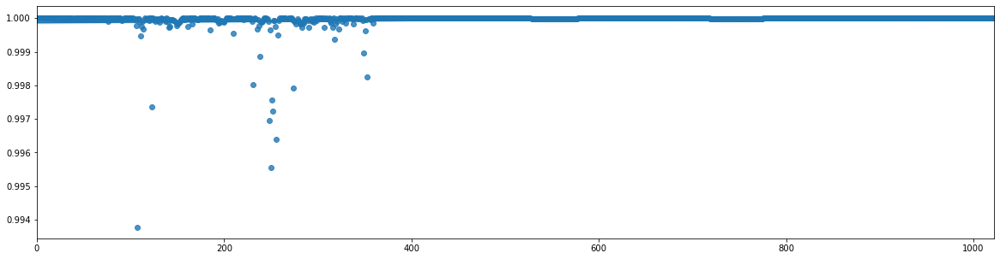

In [23]:
results = inference_pipe.segment_text(sample_text)
result_probabs = np.array(results[0])
plt.figure(figsize=(20,5))
sns.regplot(np.arange(1023), results[0][1:], label="hypo")
plt.show()

In [24]:
print(" ".join(tokenized[:100]) + "\n")
print(" ".join(tokenized[100:250])+ "\n")
print(" ".join(tokenized[250:400])+ "\n")
print(" ".join(tokenized[400:])+ "\n")

euclidean division is the mathematical formulation of the outcome of the usual process of division of integers it asserts that given two integers the dividend and the divisor such that there are unique integers the quotient and the remainder such that bq and where denotes the absolute value of of integers integers are not closed under division apart from division by zero being undefined the quotient is not an integer unless the dividend is an integer multiple of the divisor for example cannot be divided by to give an integer such case uses one of five approaches say that cannot

be divided by division becomes partial function give an approximate answer as real number this is the approach usually taken in numerical computation give the answer as fraction representing rational number so the result of the division of by is displaystyle tfrac tfrac or as mixed number so displaystyle tfrac tfrac displaystyle tfrac tfrac usually the resulting fraction should be simplified the result of the d

We can see that the model roughly captures transitions in the unseen text. However, this was manually done by picking the transitions from the probability visualization. Ideally, one should threshold the probability values and identify transitions in a more robust way. 

## Deployment

We deploy the model using fastAPI and define a `/segment_transcript endpoint`. We reuse the inference pipeline from above to serve `POST` requests with predicted probabilites for the tokenized input along with the preprocessed input to the model.

## Conclusion and Future Work


This project aimed at segmenting video transcripts using bi-directional representations. We wanted to explore the idea of using large tranfromer models to capture long term dependencies in text and stil be able to use LSTMs  create bidirectional represnetations at a token level to segment large sequences of text. While we have come close to proving the hypothesis there is a lot of scope for improvement. These include the model architecture, activations, boundary represenatations. Additionallu, the model could benefit from training on a larger corpora as seen from the transition probability charts. While we have been able to test the model's performance in this constrained setting we also need to be able to apply the model to much larger sequecences. However, compute costs today make it too expensive to explore such models in this work.

## References

1. <span id="fn1">  Garrett, R., & Legon, R. (2019). CHLOE 3 Behind the Numbers: The Changing Landscape of Online Education 2019</span>
2. <span id="fn2">  James Allan, Topic Detection and Tracking: EventBased Information Organization, Kluwer Academic Publishers, Norwell, MA, USA, 2002 </span>
3. <span id="fn3">James Glass, Timothy J. Hazen, Scott Cyphers, Igor Malioutov, David Huynh, and Regina Barzilay, 2019, Recent Progress in the MIT Spoken Lecture Processing Project, MIT, Computer Science and Artificial Intelligence Laboratory Cambridge, Massachusetts, USA</span>
4. <span id="fn4">Passonneau RJ and Litman DJL 1996 Empirical analysis of three dimensions of spoken discourse: Segmentation, coherence and linguistic devices In Interdisciplinary Perspectives on Discourse (ed. Hovy E and Scott D) Springer-Verlag.</span>
5. <span id="fn5">  Allan J, Carbonell J, Doddington G, Yamron J and Yang Y 1998 Topic detection and tracking pilot study: Final report Proceedings of the 1998 DARPA Broadcast News Transcription and Understanding Workshop.</span>
6. <span id="fn6">  Matthew Purver, Spoken Language Understanding, chapter Topic Segmentation, pp. 291–317, John Wiley & Sons, Ltd, 2011.</span>
7. <span id="fn7">  Riedl, Martin and Biemann, Chris, ACL 2012, TopicTiling: A Text Segmentation Algorithm Based on LDA, Proceedings of ACL 2012 Student Research Workshop, pp, 37–42.</span>
8. <span id="fn8">  Freddy Y. Y. Choi, “Advances in domain independent linear text segmentation,” in Proceedings of the 1st North American Chapter of the Association for Computational Linguistics Conference, 2000, pp. 26–33.</span>
9. <span id="fn9"> . David M. Blei and Pedro J. Moreno, “Topic segmentation with an aspect hidden markov model,” in Proceedings of the 24th Annual International ACM SIGIR Conference on Research and Development in Information Retrieval, 2001, pp. 343–348.</span>
10. <span id="fn10">  Xiaoxuan Wang, Lei Xie, Mimi Lu, Bin Ma, Engsiong Chng, and Haizhou Li, “Broadcast news story segmentation using conditional random fields and multimoda features,” IEICE Transactions, vol. 95-D, no. 5, pp. 1206–1215, 2012</span>
11. <span id="fn11">  Jia Yu, Xiong Xiao, Lei Xie, Eng Siong Chng, and Haizhou Li, “A dnn-hmm approach to story segmentation,” in INTERSPEECH, 2016, pp. 1527–1531.</span>
12. <span id="fn12">  Mehryar Mohri, Pedro Moreno, and Eugene Weinstein, “Discriminative topic segmentation of text and speech,” in Proceedings of the Thirteenth International Conference on Artificial Intelligence and Statistics, 2010, pp. 533–540.</span>
13. <span id="fn13">Reynar C Jeffrey, 1994, An Automatic Method of Finding Topic Boundaries.</span>
14. <span id="fn14">  Imran Sheikh, Dominique Fohr, Irina Illina. Topic segmentation in ASR transcripts using bidirectional rnns for change detection. ASRU 2017 - IEEE Automatic Speech Recognition and Understanding Workshop, Dec 2017, Okinawa, Japan.</span>
15. <span id="fn15">  http://people.idsia.ch/~juergen/fundamentaldeeplearningproblem.html</span>
16. <span id="fn16">  Zihang Dai and Zhilin Yang and Yiming Yang and Jaime Carbonell and Quoc V. Le and Ruslan Salakhutdinov, Transformer-XL: Attentive Language Models Beyond a Fixed-Length Context, 2019.</span>
17. <span id="fn17">  Beltagy, Iz & Peters, Matthew & Cohan, Arman. (2020). Longformer: The Long-Document Transformer.</span>
18. <span id="fn18">  Nikita Kitaev and Łukasz Kaiser and Anselm Levskaya. (2020). Reformer: The Efficient Transformer.</span>
19. <span id="fn19">  http://api.khanacademy.org/api/internal/videos/{}/transcript</span>
20. <span id="fn20">  http://api.khanacademy.org/api/v1/topictree</span>
21. <span id="fn21">T Mikolov, I Sutskever, K Chen, GS Corrado, J Dean, NIPS 2013, Distributed representations of words and phrases and their compositionality.</span>
22. <span id="fn22">Doug Beeferman, Adam Berger, John Lafferty, Machine Learning 34, 177–210 (1999), Statistical Models for Text Segmentation.</span>
23. <span id="fn23">  https://www.tensorflow.org/tfx/guide/serving</span>
24. <span id="fn24">  https://fastapi.tiangolo.com/</span>